# Second Model
The purpose of this notebook is to train models on training data generated after feature engineering in feature_engineering_sql.ipynb.

Importing packages:

In [1]:
import pandas as pd
from importlib import reload
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_formats = ['retina']
%matplotlib inline

plt.rcParams['figure.figsize'] = (9, 6)
sns.set(context='notebook', style='whitegrid', font_scale=1.2)

from collections import OrderedDict
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn import datasets
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss

Importing my written functions for KNN and Logistic Regression Modeling:

In [2]:
from logistic_reg_model_eval import *

In [3]:
from knn_model_eval import *

## Initial Modeling of the Training Data:

Reading in pickle of the training horses:

In [4]:
training_horses_2 = pd.read_pickle('./Data/training_horses_2.pkl')

### Initial Modeling of Training Horses - Logistic Regression

First, I want to plot some of the continuous features in my first model table (model_df) for show/no show, to see if there is much class separability:

In [5]:
training_horses_2.columns

Index(['race_id', 'horse_id', 'result', 'lengths_behind', 'horse_age',
       'horse_type', 'horse_country', 'horse_rating', 'horse_gear',
       'declared_weight', 'actual_weight', 'draw', 'finish_time', 'place_odds',
       'date', 'venue', 'config', 'surface', 'distance', 'show',
       'three_race_rolling_avg_finish', 'three_race_rolling_average_lengths',
       'three_race_rolling_average_time',
       'three_race_rolling_average_distance_per_time', 'avg_field_rating',
       'field_rating_rank', 'diff_from_field_rating_avg', 'avg_field_age',
       'field_age_rank', 'diff_from_field_age_avg', 'avg_field_dec_wgts',
       'diff_from_field_declared_wgt_avg', 'field_dec_wgt_rank',
       'avg_field_actual_wgt', 'diff_from_field_handicap_wgt_avg',
       'field_handicap_wgt_rank', 'career_races', 'career_shows',
       'shows_in_last_5_races'],
      dtype='object')

Copying the training_horses_2 dataframe, just in case I make mistakes while working with it.

In [6]:
training_horses_2_copy = training_horses_2.copy()

### Data Cleaning:

In [7]:
training_horses_2_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63129 entries, 0 to 79446
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   race_id                                       63129 non-null  int64  
 1   horse_id                                      63129 non-null  int64  
 2   result                                        63129 non-null  int64  
 3   lengths_behind                                63129 non-null  float64
 4   horse_age                                     63129 non-null  int64  
 5   horse_type                                    63127 non-null  object 
 6   horse_country                                 63127 non-null  object 
 7   horse_rating                                  63129 non-null  int64  
 8   horse_gear                                    63129 non-null  object 
 9   declared_weight                               63129 non-null 

Looking at my null values above, there are a few different situations to make situations on:
- horse_type/country: can fill these
- various metrics: these are based, mainly, on these horses not having run before. For the sake of the KNN and logistic regression models, I will drop those, although for some other models (forests, etc.) I should be able to keep them
- place_odds: I will keep these - odds are here to help calculate potential payoffs based on my models, but if a given observation doesn't have place_odds, it simply won't be bet on

### horse_type:

In [8]:
training_horses_2_copy.horse_type.value_counts()

Gelding    59804
Brown       1721
Horse        933
Colt         248
Mare         167
Rig          149
Roan          47
Filly         41
Grey          17
Name: horse_type, dtype: int64

Similar to in initial_model_eda.ipynb, there are some different things going on here.  Will use my same decision:

**Decision: make horses that say color (Brown, Roan, Grey, or None) as "Gelding", since that is 90% of the horses in the set.**

In [9]:
for i, value in enumerate(training_horses_2_copy['horse_type']):
    if training_horses_2_copy.iloc[i, 5] == 'Brown':
        training_horses_2_copy.iloc[i, 5] = "Gelding"
    elif training_horses_2_copy.iloc[i, 5] == 'Roan':
        training_horses_2_copy.iloc[i, 5] = "Gelding"
    elif training_horses_2_copy.iloc[i, 5] == 'Grey':
        training_horses_2_copy.iloc[i, 5] = "Gelding"

In [10]:
#FIlling in any nan gender values with Gelding, for same rationale above.
training_horses_2_copy.horse_type.fillna(value='Gelding', inplace=True)

In [11]:
training_horses_2_copy.horse_type.value_counts()

Gelding    61591
Horse        933
Colt         248
Mare         167
Rig          149
Filly         41
Name: horse_type, dtype: int64

In [12]:
training_horses_2_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63129 entries, 0 to 79446
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   race_id                                       63129 non-null  int64  
 1   horse_id                                      63129 non-null  int64  
 2   result                                        63129 non-null  int64  
 3   lengths_behind                                63129 non-null  float64
 4   horse_age                                     63129 non-null  int64  
 5   horse_type                                    63129 non-null  object 
 6   horse_country                                 63127 non-null  object 
 7   horse_rating                                  63129 non-null  int64  
 8   horse_gear                                    63129 non-null  object 
 9   declared_weight                               63129 non-null 

horse_type is cleaned

### Horse_Country:

In [13]:
training_horses_2_copy.horse_country.value_counts()

AUS    23885
NZ     22181
IRE     8129
GB      4741
USA     2044
FR      1089
SAF      445
GER      309
JPN       80
CAN       72
ITY       47
ARG       42
GR        33
BRZ       18
ZIM       12
Name: horse_country, dtype: int64

Checking out the two that are null:

In [14]:
training_horses_2_copy[training_horses_2_copy.horse_country.isnull()]

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_age_avg,avg_field_dec_wgts,diff_from_field_declared_wgt_avg,field_dec_wgt_rank,avg_field_actual_wgt,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races
78608,69,2645,11,9.25,3,Gelding,None,60,--,1105.0,...,0.0,1105.583333,-0.583333,5,122.25,-3.25,9,1,0.0,0.0
79268,13,2645,5,2.25,3,Gelding,None,60,--,1107.0,...,0.0,1063.250000,43.750000,3,122.00,-2.00,8,0,NaN,NaN


Since this is horses 2645, I'll fill check to see if there's info from other races:

In [15]:
training_horses_2_copy[training_horses_2_copy.horse_id == 2645]

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_age_avg,avg_field_dec_wgts,diff_from_field_declared_wgt_avg,field_dec_wgt_rank,avg_field_actual_wgt,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races
78608,69,2645,11,9.25,3,Gelding,None,60,--,1105.0,...,0.0,1105.583333,-0.583333,5,122.25,-3.25,9,1,0.0,0.0
79268,13,2645,5,2.25,3,Gelding,None,60,--,1107.0,...,0.0,1063.250000,43.750000,3,122.00,-2.00,8,0,NaN,NaN


There is not.  **DECISION: make country equal to AUS, since that is the most common country**.

In [16]:
training_horses_2_copy.horse_country.fillna(value='AUS', inplace=True)

In [17]:
training_horses_2_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63129 entries, 0 to 79446
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   race_id                                       63129 non-null  int64  
 1   horse_id                                      63129 non-null  int64  
 2   result                                        63129 non-null  int64  
 3   lengths_behind                                63129 non-null  float64
 4   horse_age                                     63129 non-null  int64  
 5   horse_type                                    63129 non-null  object 
 6   horse_country                                 63129 non-null  object 
 7   horse_rating                                  63129 non-null  int64  
 8   horse_gear                                    63129 non-null  object 
 9   declared_weight                               63129 non-null 

Country is cleaned.

### Place Odds:

In [18]:
training_horses_2_copy[training_horses_2_copy.place_odds.isnull()]

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_age_avg,avg_field_dec_wgts,diff_from_field_declared_wgt_avg,field_dec_wgt_rank,avg_field_actual_wgt,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races
0,6348,216,1,0.00,3,Gelding,AUS,93,B1/H1,1096.0,...,-1.071429,1131.142857,-35.142857,9,124.785714,5.214286,2,0,NaN,NaN
1,6348,1698,2,0.20,6,Gelding,AUS,92,TT/B,1172.0,...,1.928571,1131.142857,40.857143,4,124.785714,4.214286,4,36,13.0,2.0
3,6348,833,4,0.75,4,Gelding,IRE,89,CP,1154.0,...,-0.071429,1131.142857,22.857143,5,124.785714,1.214286,7,19,9.0,2.0
4,6348,3368,5,1.25,3,Gelding,GER,91,TT/B/H,1147.0,...,-1.071429,1131.142857,15.857143,8,124.785714,3.214286,5,4,4.0,4.0
5,6348,1238,6,1.25,5,Gelding,AUS,87,TT/V,1191.0,...,0.928571,1131.142857,59.857143,3,124.785714,-2.785714,10,25,12.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70048,751,713,4,3.25,3,Gelding,AUS,60,--,1216.0,...,0.000000,1143.636364,72.363636,3,121.272727,-4.272727,9,6,2.0,1.0
70049,751,2973,5,4.25,3,Gelding,AUS,60,--,1116.0,...,0.000000,1143.636364,-27.636364,8,121.272727,-0.272727,5,14,1.0,1.0
70052,751,1359,8,5.25,3,Horse,IRE,60,--,1237.0,...,0.000000,1143.636364,93.363636,2,121.272727,10.727273,1,1,0.0,0.0
70053,751,1204,9,6.75,3,Horse,FR,60,--,1149.0,...,0.000000,1143.636364,5.363636,4,121.272727,6.727273,2,10,1.0,0.0


Looks like there are various reaons for this, but since this is only going to be used as an extra calculation, I'll leave these in.  No reason to remove all of the rows.

### Various Feature Engineering Metrics

Likely, these are NaN since they are based on previous performance - i.e, a horse with no previous races has no previous stats.

In [19]:
dummy_df = training_horses_2_copy[training_horses_2_copy.three_race_rolling_average_lengths.isnull()]

In [20]:
dummy_df.sample(10)

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_age_avg,avg_field_dec_wgts,diff_from_field_declared_wgt_avg,field_dec_wgt_rank,avg_field_actual_wgt,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races
994,6270,3375,14,6.50,3,Gelding,IRE,57,B1/H1,1093.0,...,-1.071429,1101.571429,-8.571429,7,123.357143,6.642857,3,0,NaN,NaN
77990,118,3599,6,11.00,3,Gelding,AUS,60,--,1078.0,...,0.000000,1138.666667,-60.666667,10,122.333333,-2.333333,8,0,NaN,NaN
1965,6192,946,7,4.00,3,Gelding,AUS,52,--,1164.0,...,0.000000,1105.083333,58.916667,2,121.000000,1.000000,5,0,NaN,NaN
55264,1928,1307,8,2.50,3,Gelding,AUS,60,--,1136.0,...,0.000000,1082.750000,53.250000,2,122.666667,-1.666667,6,0,NaN,NaN
49426,2400,1655,13,10.50,3,Gelding,NZ,67,--,943.0,...,-0.071429,1115.071429,-172.071429,14,119.857143,-4.857143,11,0,NaN,NaN
45985,2671,153,10,4.25,2,Gelding,AUS,92,TT1,1140.0,...,-1.076923,1133.923077,6.076923,6,125.307692,4.692308,2,0,NaN,NaN
42411,2958,3825,7,8.50,3,Gelding,AUS,60,--,1098.0,...,0.090909,1086.636364,11.363636,5,123.000000,-5.000000,10,0,NaN,NaN
57187,1775,59,11,7.50,3,Gelding,AUS,60,--,1007.0,...,0.000000,1108.357143,-101.357143,13,123.285714,1.714286,5,0,NaN,NaN
38767,3251,3015,10,7.25,3,Gelding,NZ,60,--,1180.0,...,0.000000,1103.928571,76.071429,2,122.428571,1.571429,5,0,NaN,NaN
78843,49,2179,9,1.75,3,Gelding,AUS,60,--,1141.0,...,0.000000,1145.285714,-4.285714,7,122.928571,2.071429,4,0,NaN,NaN


Looks like they all have no career races - will double check with a value counter:

In [21]:
dummy_df.career_races.value_counts()

0    3524
Name: career_races, dtype: int64

In [22]:
training_horses_2_copy.shape[0] - dummy_df.shape[0]

59605

So these are all horses in their first career race, and based on the math above these account for all of the remaining rate-nulls.  **DECISION: REMOVE THESE ROWS**.  This is a good chunk of data at 3500+ rows, but in my opinion I wouldn't be betting smartly if I bet on a horse I had no previous race data on.  Thus, based on the use case these are ok to exclude from the model.

In [23]:
training_horses_2_cleaned = training_horses_2_copy[training_horses_2_copy['three_race_rolling_average_lengths'].notna()]

In [24]:
training_horses_2_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59605 entries, 1 to 79203
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   race_id                                       59605 non-null  int64  
 1   horse_id                                      59605 non-null  int64  
 2   result                                        59605 non-null  int64  
 3   lengths_behind                                59605 non-null  float64
 4   horse_age                                     59605 non-null  int64  
 5   horse_type                                    59605 non-null  object 
 6   horse_country                                 59605 non-null  object 
 7   horse_rating                                  59605 non-null  int64  
 8   horse_gear                                    59605 non-null  object 
 9   declared_weight                               59605 non-null 

In [25]:
training_horses_2_cleaned.sample(10)

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_age_avg,avg_field_dec_wgts,diff_from_field_declared_wgt_avg,field_dec_wgt_rank,avg_field_actual_wgt,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races
46432,2635,4265,1,0.00,3,Gelding,AUS,60,--,1134.0,...,0.000000,1119.000000,15.000000,5,124.769231,-0.769231,7,36,7.0,1.0
64253,1209,1362,5,7.50,3,Gelding,GB,60,--,1097.0,...,0.000000,1104.357143,-7.357143,6,122.428571,-0.428571,7,14,5.0,1.0
64899,1158,3880,6,5.00,3,Gelding,NZ,60,--,1129.0,...,0.000000,1081.916667,47.083333,3,123.083333,0.916667,6,5,1.0,1.0
57730,1732,3091,1,0.00,3,Gelding,AUS,60,--,1032.0,...,0.000000,1096.285714,-64.285714,13,123.000000,3.000000,6,6,3.0,3.0
34769,3567,901,5,1.75,2,Gelding,AUS,62,SR,1180.0,...,-1.166667,1125.083333,54.916667,3,123.750000,-6.750000,11,3,3.0,3.0
40818,3088,2064,11,6.25,5,Gelding,AUS,100,TT,1176.0,...,1.750000,1107.500000,68.500000,2,120.666667,10.333333,1,24,13.0,3.0
73312,493,2650,12,9.75,3,Gelding,NZ,60,--,1052.0,...,0.000000,1100.076923,-48.076923,12,120.384615,2.615385,4,12,1.0,0.0
52807,2130,3611,7,3.75,3,Gelding,AUS,60,--,1095.0,...,0.000000,1085.000000,10.000000,7,122.000000,9.000000,1,14,3.0,2.0
59415,1599,3886,7,4.00,3,Gelding,AUS,60,--,1087.0,...,0.000000,1132.769231,-45.769231,9,122.692308,-7.692308,12,3,1.0,1.0
18632,4862,2387,9,2.75,8,Gelding,FR,64,--,1106.0,...,3.916667,1121.833333,-15.833333,7,123.500000,-4.500000,9,52,9.0,1.0


## Pickling Data, so i don't have to clean again.

In [26]:
training_horses_2_cleaned.to_pickle("./Data/training_horses_2_cleaned.pkl")

# Modeling

### One Hot Encoding of Gender (horse_type):

In [27]:
ohe = OneHotEncoder(drop='first', sparse=False)

In [28]:
training_model_gender_cat = training_horses_2_cleaned.loc[:, ['horse_type']]

In [29]:
ohe.fit(training_model_gender_cat)

ohe_X = ohe.transform(training_model_gender_cat)

columns = ohe.get_feature_names(['horse_type'])

ohe_X_df = pd.DataFrame(ohe_X, columns=columns, index=training_model_gender_cat.index)

ohe_X_df.sample(20)

,horse_type_Filly,horse_type_Gelding,horse_type_Horse,horse_type_Mare,horse_type_Rig
2958,0.0,1.0,0.0,0.0,0.0
77135,0.0,1.0,0.0,0.0,0.0
78887,0.0,1.0,0.0,0.0,0.0
48237,0.0,1.0,0.0,0.0,0.0
69568,0.0,1.0,0.0,0.0,0.0
24161,0.0,1.0,0.0,0.0,0.0
24825,0.0,1.0,0.0,0.0,0.0
14826,0.0,1.0,0.0,0.0,0.0
7245,0.0,1.0,0.0,0.0,0.0
44088,0.0,0.0,1.0,0.0,0.0


Concatenating back into the original data frame:

In [30]:
comb_training_horses_2_cleaned = pd.concat([training_horses_2_cleaned, ohe_X_df], axis=1)

In [31]:
comb_training_horses_2_cleaned.head()

,race_id,horse_id,result,lengths_behind,horse_age,horse_type,horse_country,horse_rating,horse_gear,declared_weight,...,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races,horse_type_Filly,horse_type_Gelding,horse_type_Horse,horse_type_Mare,horse_type_Rig
1,6348,1698,2,0.20,6,Gelding,AUS,92,TT/B,1172.0,...,4.214286,4,36,13.0,2.0,0.0,1.0,0.0,0.0,0.0
3,6348,833,4,0.75,4,Gelding,IRE,89,CP,1154.0,...,1.214286,7,19,9.0,2.0,0.0,1.0,0.0,0.0,0.0
4,6348,3368,5,1.25,3,Gelding,GER,91,TT/B/H,1147.0,...,3.214286,5,4,4.0,4.0,0.0,1.0,0.0,0.0,0.0
5,6348,1238,6,1.25,5,Gelding,AUS,87,TT/V,1191.0,...,-2.785714,10,25,12.0,1.0,0.0,1.0,0.0,0.0,0.0
6,6348,985,7,2.25,5,Gelding,NZ,84,--,1070.0,...,-5.785714,12,28,8.0,0.0,0.0,1.0,0.0,0.0,0.0


In [32]:
#Removing original horse_type column:
comb_training_horses_2_cleaned.drop(columns='horse_type', inplace=True)
comb_training_horses_2_cleaned.head()

,race_id,horse_id,result,lengths_behind,horse_age,horse_country,horse_rating,horse_gear,declared_weight,actual_weight,...,diff_from_field_handicap_wgt_avg,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races,horse_type_Filly,horse_type_Gelding,horse_type_Horse,horse_type_Mare,horse_type_Rig
1,6348,1698,2,0.20,6,AUS,92,TT/B,1172.0,129,...,4.214286,4,36,13.0,2.0,0.0,1.0,0.0,0.0,0.0
3,6348,833,4,0.75,4,IRE,89,CP,1154.0,126,...,1.214286,7,19,9.0,2.0,0.0,1.0,0.0,0.0,0.0
4,6348,3368,5,1.25,3,GER,91,TT/B/H,1147.0,128,...,3.214286,5,4,4.0,4.0,0.0,1.0,0.0,0.0,0.0
5,6348,1238,6,1.25,5,AUS,87,TT/V,1191.0,122,...,-2.785714,10,25,12.0,1.0,0.0,1.0,0.0,0.0,0.0
6,6348,985,7,2.25,5,NZ,84,--,1070.0,119,...,-5.785714,12,28,8.0,0.0,0.0,1.0,0.0,0.0,0.0


OHE Complete.

### Feature Selection:

Adding one more feature for now - show rate (i.e. column career_shows / career_races):

In [33]:
comb_training_horses_2_cleaned['career_show_rate'] = comb_training_horses_2_cleaned['career_shows'] / comb_training_horses_2_cleaned['career_races']

In [34]:
comb_training_horses_2_cleaned.sample(5)

,race_id,horse_id,result,lengths_behind,horse_age,horse_country,horse_rating,horse_gear,declared_weight,actual_weight,...,field_handicap_wgt_rank,career_races,career_shows,shows_in_last_5_races,horse_type_Filly,horse_type_Gelding,horse_type_Horse,horse_type_Mare,horse_type_Rig,career_show_rate
21192,4659,1289,8,3.75,4,NZ,34,--,1242.0,127,...,5,11,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.000000
58607,1663,3944,6,2.25,3,AUS,60,--,1038.0,114,...,10,24,5.0,1.0,0.0,1.0,0.0,0.0,0.0,0.208333
49547,2390,49,3,2.25,3,AUS,60,--,1178.0,133,...,1,8,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.125000
1668,6215,2143,3,0.25,5,USA,87,H,1101.0,111,...,11,21,8.0,3.0,0.0,1.0,0.0,0.0,0.0,0.380952
48365,2483,489,6,2.00,3,IRE,60,--,1133.0,112,...,12,41,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.195122


In [35]:
comb_training_horses_2_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59605 entries, 1 to 79203
Data columns (total 44 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   race_id                                       59605 non-null  int64  
 1   horse_id                                      59605 non-null  int64  
 2   result                                        59605 non-null  int64  
 3   lengths_behind                                59605 non-null  float64
 4   horse_age                                     59605 non-null  int64  
 5   horse_country                                 59605 non-null  object 
 6   horse_rating                                  59605 non-null  int64  
 7   horse_gear                                    59605 non-null  object 
 8   declared_weight                               59605 non-null  float64
 9   actual_weight                                 59605 non-null 

Using the following columns:
- Features - Numerical: result, lengths_behind, horse_age, declared_weight, actual_weight, horse_rating, draw, three_race_rolling_avg_finish, three_race_rolling_average_lengths, three_race_rolling_average_time, three_race_rolling_average_distance_per_time, field_rating_rank, diff_from_field_rating_avg, field_age_rank, diff_from_field_age_avg, diff_from_field_declared_wgt_avg, field_dec_wgt_rank, diff_from_field_handicap_wgt_avg, field_handicap_wgt_rank, career_races, career_shows, shows_in_last_5_races, career_show_rate
- Features - Categorical: horse_type_Filly, horse_type_Gelding, horse_type_Horse, horse_type_Mare, horse_type_Rig
- Target - show

In [36]:
columns_1 = ['result', 'lengths_behind', 'horse_age', 'declared_weight', 'actual_weight', 'horse_rating', 'draw', 'three_race_rolling_avg_finish', 'three_race_rolling_average_lengths', 'three_race_rolling_average_time', 'three_race_rolling_average_distance_per_time', 'field_rating_rank', 'diff_from_field_rating_avg', 'field_age_rank', 'diff_from_field_age_avg', 'diff_from_field_declared_wgt_avg', 'field_dec_wgt_rank', 'diff_from_field_handicap_wgt_avg', 'field_handicap_wgt_rank', 'career_races', 'career_shows', 'shows_in_last_5_races', 'career_show_rate', 'horse_type_Filly', 'horse_type_Gelding', 'horse_type_Horse', 'horse_type_Mare', 'horse_type_Rig']

In [37]:
X = comb_training_horses_2_cleaned[columns]
y = comb_training_horses_2_cleaned['show']

## Pairplots

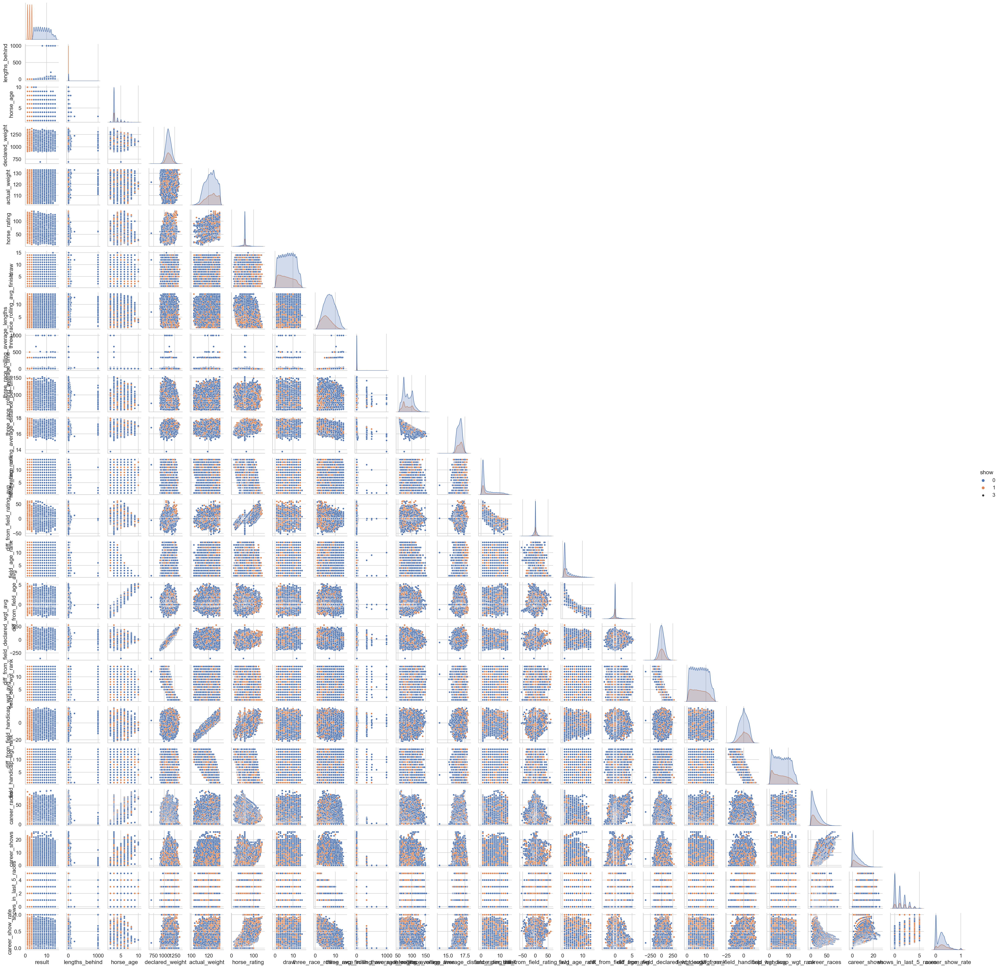

In [44]:
sns.pairplot(comb_training_horses_2_cleaned[['result', 'lengths_behind', 'horse_age', 'declared_weight', 'actual_weight', 'horse_rating', 'draw', 'three_race_rolling_avg_finish', 'three_race_rolling_average_lengths', 'three_race_rolling_average_time', 'three_race_rolling_average_distance_per_time', 'field_rating_rank', 'diff_from_field_rating_avg', 'field_age_rank', 'diff_from_field_age_avg', 'diff_from_field_declared_wgt_avg', 'field_dec_wgt_rank', 'diff_from_field_handicap_wgt_avg', 'field_handicap_wgt_rank', 'career_races', 'career_shows', 'shows_in_last_5_races', 'career_show_rate', 'show']], corner=True, height=1.5, plot_kws={'size': 3}, hue='show');

None have particularly good separability.

### KNN Model:

/Users/patrickbovard/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


The accuracy score for kNN is
Training:  75.63%
Validation set:  75.63%
Validation Set F1 Score: 0.0000:
Validation Set Fbeta Score (beta=0.5): 0.0000
Validation set Precision: 0.0000
Validation set recall: 0.0000 



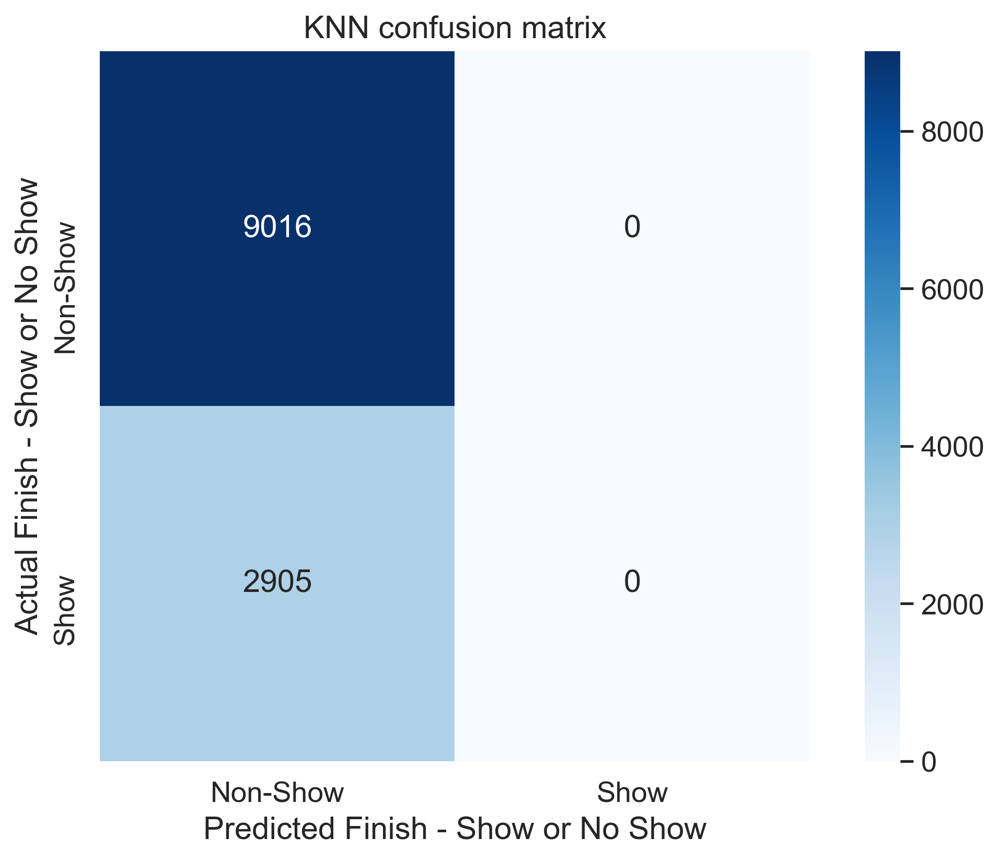

In [38]:
KNN_accuracy_scorer(X, y, n = 21)

## Logistic Regression:

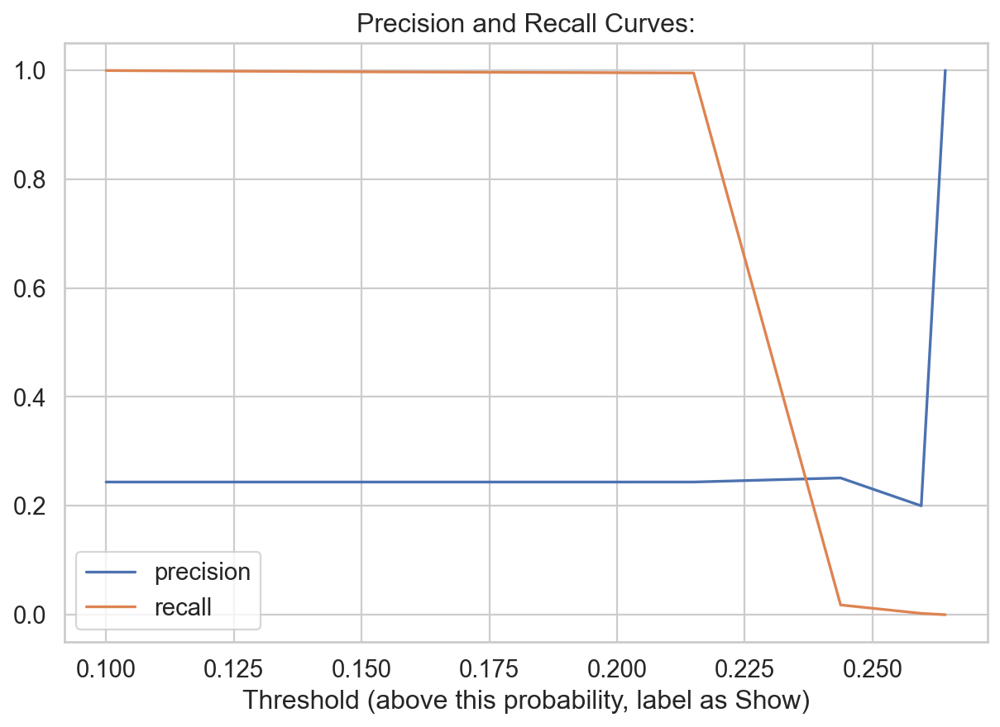

In [39]:
log_precision_and_recall_curves(X,y,C=0.95)

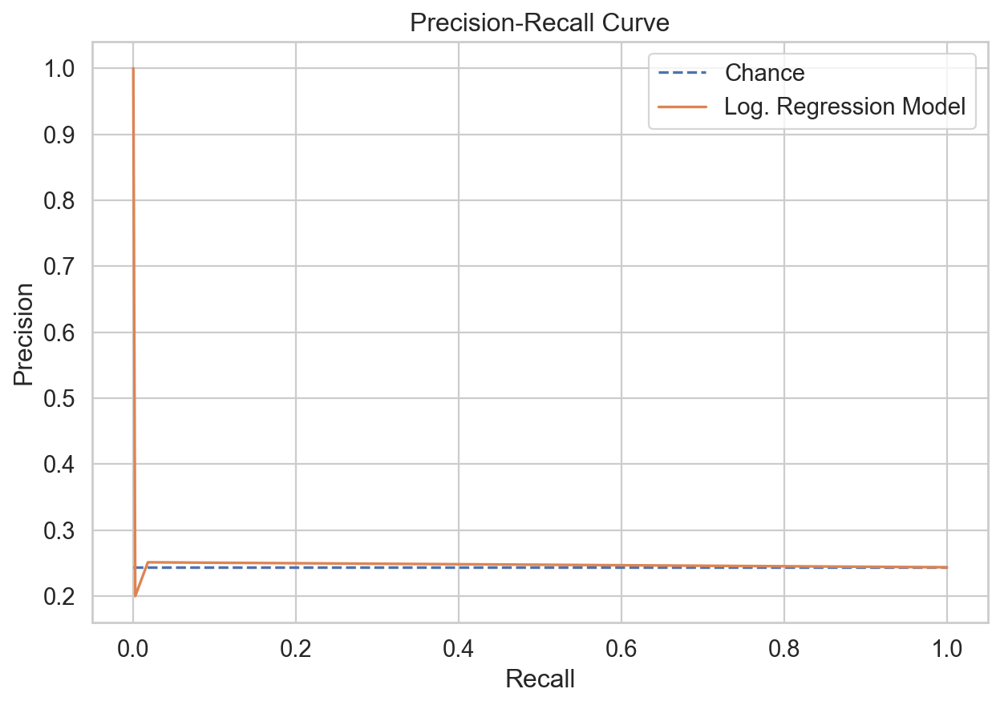

In [40]:
log_precision_recall_curve_generator(X,y,C=0.95)

ROC AUC score =  0.5004843559814107
Optimal Threshold: 0.2595
Threshold for Max Precision: 0.1000


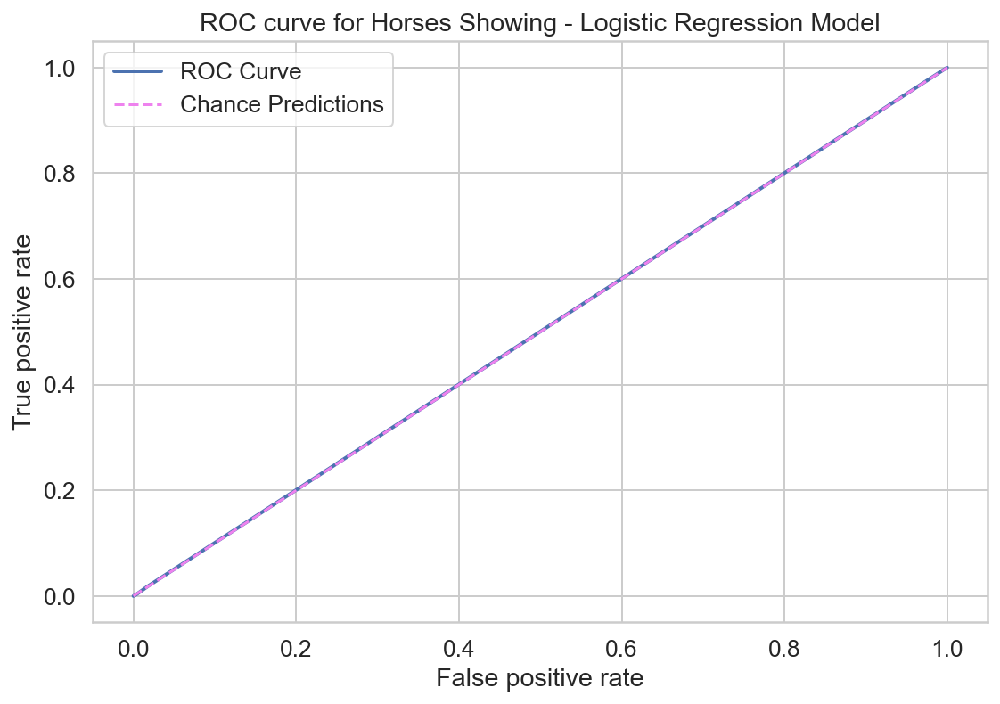

In [63]:
log_roc_curve_generator(X,y,C=10)

The accuracy score for logistic regression w/ threshold of 0.2 is:
Validation set accuracy:  24.52%
Additional Model Metrics:
Validation Set F1 Score: 0.3917:
Validation Set Fbeta Score (beta=0.5): 0.2871
Validation set Precision: 0.2437
Validation set recall: 0.9972 

Validation set log-loss score: 26.0706
Confusion Matrix, Threshold = 0.2


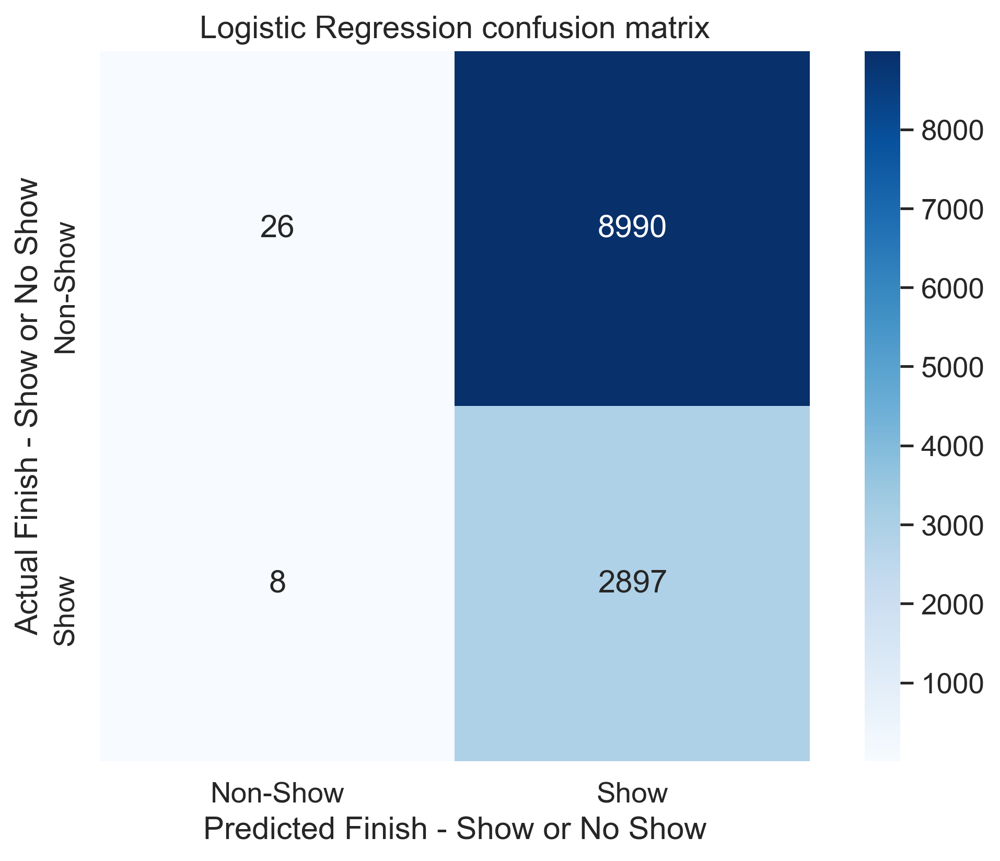

In [165]:
log_accuracy_scorer(X, y, threshold=0.2, C=0.95, beta=0.5)

In [159]:
def payout_calculator(X,y,odds,bet_size=5, threshold=0.5, C=0.95, beta=0.5):
    #Splitting into train and val sets:
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=5, stratify=y)
    
    #Standard Scaling of Features
    std = StandardScaler()
    std.fit(X_train.values)
    X_train_scaled = std.transform(X_train.values)
    X_val_scaled = std.transform(X_val.values)
    
    #Running Logistic Regression, fitting the model:
    logit = LogisticRegression(solver='lbfgs', C = C)
    logit.fit(X_train_scaled, y_train)
    
    #Confusion Matrix, utilizing threshold:
    y_predict = (logit.predict_proba(X_val_scaled)[:,1] >= threshold)
    
    payout = 0
    for i, pred in enumerate(y_predict):
        if pred:
            if y_val.iloc[i] == 1:
                payout += (bet_size*2)
        elif y_val.iloc[i] == 0:
            payout -= bet_size
    print(payout)
            
            

In [160]:
comb_training_horses_2_cleaned.place_odds.fillna(value=0, inplace=True)

In [161]:
odds = comb_training_horses_2_cleaned[['place_odds']]
bet_size = 5

In [164]:
payout_calculator(X,y,odds,bet_size, threshold=0.2, C=0.95, beta=0.5)

28840
